# Using a linear regression predictive model to predict number of available bikes 

The model estimated is a linear model taking the form:

𝑡𝑎𝑟𝑔𝑒𝑡_𝑓𝑒𝑎𝑡𝑢𝑟𝑒=𝑤0+𝑤1∗𝑓𝑒𝑎𝑡𝑢𝑟𝑒1+𝑤2∗𝑓𝑒𝑎𝑡𝑢𝑟𝑒2+...+𝑤𝑛∗𝑓𝑒𝑎𝑡𝑢𝑟𝑒𝑛 

The target feature is availableBikes

### Reading Data

In [1]:
# Library Imports.
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
# Allows plots to appear directly in the notebook.
%matplotlib inline
# filter warnings, we may want them but for now I removed them
import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn import metrics

In [2]:
# Read stations csv file stored after data prep into a dataframe.
df_availability_and_weather = pd.read_csv('stations_model_data.csv')
df_availability_and_weather.head(50)

,Unnamed: 0,stationId,totalStands,availableBikes,freeStands,lastUpdate,mainWeather,temperature,cloudiness,windSpeed,rain,snow,weekday,fullHour
0,0,2,20,10,10,2021-02-27 17:35:14,Clouds,9.34,75.0,2.57,0.0,0.0,Saturday,17
1,1,2,20,10,10,2021-02-27 17:45:23,Clouds,9.20,75.0,1.03,0.0,0.0,Saturday,17
2,2,2,20,10,10,2021-02-27 17:55:32,Clouds,9.48,75.0,1.03,0.0,0.0,Saturday,17
3,3,2,20,11,9,2021-02-27 18:00:42,Clouds,9.22,75.0,1.03,0.0,0.0,Saturday,18
4,4,2,20,11,9,2021-02-27 18:10:51,Clouds,8.85,75.0,0.51,0.0,0.0,Saturday,18
5,5,2,20,11,9,2021-02-27 18:20:59,Clouds,8.76,75.0,0.51,0.0,0.0,Saturday,18
6,6,2,20,11,9,2021-02-27 18:31:08,Clouds,8.52,75.0,0.51,0.0,0.0,Saturday,18
7,7,2,20,11,9,2021-02-27 18:41:17,Clouds,8.17,75.0,1.03,0.0,0.0,Saturday,18
8,8,2,20,11,9,2021-02-27 18:51:25,Clouds,8.26,75.0,2.06,0.0,0.0,Saturday,18
9,9,2,20,11,9,2021-02-27 19:01:34,Clouds,8.01,75.0,1.03,0.0,0.0,Saturday,19


In [3]:
df_availability_and_weather.shape

(488580, 14)

In [4]:
df_availability_and_weather.dtypes

Unnamed: 0          int64
stationId           int64
totalStands         int64
availableBikes      int64
freeStands          int64
lastUpdate         object
mainWeather        object
temperature       float64
cloudiness        float64
windSpeed         float64
rain              float64
snow              float64
weekday            object
fullHour            int64
dtype: object

In [5]:
# drop column 'unnamed: 0' that was automatically created (don't know why)
df_availability_and_weather = df_availability_and_weather.drop(columns=['Unnamed: 0'])

In [6]:
df_availability_and_weather

,stationId,totalStands,availableBikes,freeStands,lastUpdate,mainWeather,temperature,cloudiness,windSpeed,rain,snow,weekday,fullHour
0,2,20,10,10,2021-02-27 17:35:14,Clouds,9.34,75.0,2.57,0.0,0.0,Saturday,17
1,2,20,10,10,2021-02-27 17:45:23,Clouds,9.20,75.0,1.03,0.0,0.0,Saturday,17
2,2,20,10,10,2021-02-27 17:55:32,Clouds,9.48,75.0,1.03,0.0,0.0,Saturday,17
3,2,20,11,9,2021-02-27 18:00:42,Clouds,9.22,75.0,1.03,0.0,0.0,Saturday,18
4,2,20,11,9,2021-02-27 18:10:51,Clouds,8.85,75.0,0.51,0.0,0.0,Saturday,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...
488575,507,1,0,1,2021-03-28 12:55:47,Clouds,14.53,75.0,9.26,0.0,0.0,Sunday,12
488576,507,1,1,0,2021-03-28 13:06:21,Clouds,14.71,75.0,9.26,0.0,0.0,Sunday,13
488577,507,1,1,0,2021-03-28 13:13:37,Clouds,14.55,75.0,9.77,0.0,0.0,Sunday,13
488578,507,1,0,1,2021-03-28 13:19:57,Clouds,14.72,75.0,9.77,0.0,0.0,Sunday,13


In [7]:
df_availability_and_weather.shape

(488580, 13)

In [8]:
df_availability_and_weather.dtypes

stationId           int64
totalStands         int64
availableBikes      int64
freeStands          int64
lastUpdate         object
mainWeather        object
temperature       float64
cloudiness        float64
windSpeed         float64
rain              float64
snow              float64
weekday            object
fullHour            int64
dtype: object

In [9]:
# convert lastUpdate to datetime
# kept lastUpdate to order station data
df_availability_and_weather['lastUpdate']= pd.to_datetime(df_availability_and_weather['lastUpdate'])

In [10]:
df_availability_and_weather.dtypes

stationId                  int64
totalStands                int64
availableBikes             int64
freeStands                 int64
lastUpdate        datetime64[ns]
mainWeather               object
temperature              float64
cloudiness               float64
windSpeed                float64
rain                     float64
snow                     float64
weekday                   object
fullHour                   int64
dtype: object

In [11]:
# get categorical features 
categorical_features = df_availability_and_weather[['mainWeather', 'weekday', 'stationId']].columns

In [12]:
# Convert data type to category for these columns
for column in categorical_features:
    df_availability_and_weather[column] = df_availability_and_weather[column].astype('category')  

In [13]:
df_availability_and_weather.dtypes

stationId               category
totalStands                int64
availableBikes             int64
freeStands                 int64
lastUpdate        datetime64[ns]
mainWeather             category
temperature              float64
cloudiness               float64
windSpeed                float64
rain                     float64
snow                     float64
weekday                 category
fullHour                   int64
dtype: object

In [14]:
df_availability_and_weather.nunique()

stationId            110
totalStands           18
availableBikes        41
freeStands            41
lastUpdate        378375
mainWeather            6
temperature         1746
cloudiness            16
windSpeed             50
rain                 358
snow                   1
weekday                7
fullHour              24
dtype: int64

In [15]:
# check unique values for categorical features (to compare against dummies created later)
df_availability_and_weather['mainWeather'].unique()

['Clouds', 'Fog', 'Mist', 'Clear', 'Rain', 'Drizzle']
Categories (6, object): ['Clouds', 'Fog', 'Mist', 'Clear', 'Rain', 'Drizzle']

In [16]:
df_availability_and_weather['weekday'].unique()

['Saturday', 'Sunday', 'Monday', 'Wednesday', 'Thursday', 'Friday', 'Tuesday']
Categories (7, object): ['Saturday', 'Sunday', 'Monday', 'Wednesday', 'Thursday', 'Friday', 'Tuesday']

In [17]:
# check how many rows per station
# station with Id 507 was added much later by JCDecaux so there's a big difference in the number of rows there
df_availability_and_weather['stationId'].value_counts(dropna=False)

69     4929
34     4822
31     4736
33     4732
5      4729
       ... 
117    4299
65     4272
15     4247
96     4046
507     291
Name: stationId, Length: 110, dtype: int64

In [18]:
df_availability_and_weather.loc[df_availability_and_weather['stationId'] == 507]

,stationId,totalStands,availableBikes,freeStands,lastUpdate,mainWeather,temperature,cloudiness,windSpeed,rain,snow,weekday,fullHour
488289,507,1,1,0,2021-03-26 12:05:20,Clouds,6.39,20.0,9.26,0.0,0.0,Friday,12
488290,507,1,0,1,2021-03-26 12:10:52,Clouds,6.38,20.0,9.26,0.0,0.0,Friday,12
488291,507,1,0,1,2021-03-26 12:20:58,Clouds,6.46,20.0,6.69,0.0,0.0,Friday,12
488292,507,1,0,1,2021-03-26 12:32:39,Clouds,6.25,20.0,6.69,0.0,0.0,Friday,12
488293,507,1,0,1,2021-03-26 12:42:45,Clouds,6.83,40.0,6.69,0.0,0.0,Friday,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
488575,507,1,0,1,2021-03-28 12:55:47,Clouds,14.53,75.0,9.26,0.0,0.0,Sunday,12
488576,507,1,1,0,2021-03-28 13:06:21,Clouds,14.71,75.0,9.26,0.0,0.0,Sunday,13
488577,507,1,1,0,2021-03-28 13:13:37,Clouds,14.55,75.0,9.77,0.0,0.0,Sunday,13
488578,507,1,0,1,2021-03-28 13:19:57,Clouds,14.72,75.0,9.77,0.0,0.0,Sunday,13


In [19]:
# checked below while calculating average availability that station 507 is missing some days/hours which could cause problems
# drop rows with stationId 507 since availability is either 1 or 0 and there is no data for some weekdays hours
df_availability_and_weather = df_availability_and_weather[df_availability_and_weather.stationId != 507]

In [20]:
# check rows were dropped
df_availability_and_weather.loc[df_availability_and_weather['stationId'] == 507]

,stationId,totalStands,availableBikes,freeStands,lastUpdate,mainWeather,temperature,cloudiness,windSpeed,rain,snow,weekday,fullHour


In [21]:
df_availability_and_weather.shape

(488289, 13)

In [22]:
# check number of stations - looks correct, there were 109 stations before station with Id 507 was added by JCDecaux later on
df_availability_and_weather['stationId'].nunique()

109

In [23]:
# get all station Ids in a list
station_id_list = df_availability_and_weather['stationId'].unique().tolist()

In [24]:
print(station_id_list)

[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117]


In [25]:
# doublecheck hours - looks good, 24 different full hours
# get hours in list sorted --> used to calculate average availability below
full_hour_list = df_availability_and_weather['fullHour'].value_counts().index.sort_values().tolist()

In [26]:
print(full_hour_list)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [27]:
# get weekdays in list --> used to calculate average availability below
weekdays_list = df_availability_and_weather['weekday'].value_counts().index.tolist()

In [28]:
print(weekdays_list)

['Sunday', 'Monday', 'Wednesday', 'Saturday', 'Thursday', 'Tuesday', 'Friday']


*Get mean of available bikes per station per day for each hour to later compare if the model improves this baseline*

In [29]:
def get_available_bikes_mean_per_day_and_hour(station_id, full_hour_list, weekdays_list):
    available_bikes_mean_per_day_and_hour = {}
    for weekday in weekdays_list:
        available_bikes_mean_per_day_and_hour[weekday] = []
        for hour in full_hour_list:
            available_bikes_mean_per_hour_of_day = {}
            available_bikes_mean_per_hour_of_day[hour] = 0
            list_of_unique_availability_values = df_availability_and_weather.loc[(df_availability_and_weather['stationId'] == station_id) & 
                                                (df_availability_and_weather['weekday'] == weekday) & 
                                                (df_availability_and_weather['fullHour'] == hour)].availableBikes.value_counts().index.tolist()
            
            # get mean availablity for current hour being iterated
            sum_availability = 0
            for number in list_of_unique_availability_values:
                sum_availability += number
            try:
                mean_availability = sum_availability/len(list_of_unique_availability_values)
                available_bikes_mean_per_hour_of_day[hour] = mean_availability
            except ZeroDivisionError:
                print("Division by Zero Error:", station_id, weekday, hour)
                break
            
            # append dict {hour: mean_availability} as a value for each weekday key in the available_bikes_mean_per_day_and_hour dict
            available_bikes_mean_per_day_and_hour[weekday].append(available_bikes_mean_per_hour_of_day)
            
    return {station_id : available_bikes_mean_per_day_and_hour}

In [30]:
def get_station_mean_availability_per_day_and_hour(station_id_list, full_hour_list, weekdays_list):
    mean_availability = []
    for station_id in station_id_list:
        mean_availability.append(get_available_bikes_mean_per_day_and_hour(station_id, full_hour_list, weekdays_list))
    return mean_availability

In [31]:
station_mean_availabilities = get_station_mean_availability_per_day_and_hour(station_id_list, full_hour_list, weekdays_list)

In [32]:
# dict with all the station's avg availabilities
station_mean_availabilities

[{2: {'Sunday': [{0: 7.2},
    {1: 7.2},
    {2: 7.2},
    {3: 7.2},
    {4: 7.2},
    {5: 7.2},
    {6: 7.0},
    {7: 8.4},
    {8: 7.5},
    {9: 8.142857142857142},
    {10: 9.916666666666666},
    {11: 11.142857142857142},
    {12: 10.1},
    {13: 7.9},
    {14: 7.0},
    {15: 5.75},
    {16: 6.375},
    {17: 7.083333333333333},
    {18: 8.285714285714286},
    {19: 7.818181818181818},
    {20: 7.25},
    {21: 6.714285714285714},
    {22: 7.4},
    {23: 7.166666666666667}],
   'Monday': [{0: 9.0},
    {1: 8.0},
    {2: 8.0},
    {3: 9.0},
    {4: 8.0},
    {5: 8.2},
    {6: 7.4},
    {7: 5.166666666666667},
    {8: 8.555555555555555},
    {9: 9.428571428571429},
    {10: 7.142857142857143},
    {11: 8.285714285714286},
    {12: 9.2},
    {13: 9.428571428571429},
    {14: 8.222222222222221},
    {15: 7.5},
    {16: 5.363636363636363},
    {17: 8.11111111111111},
    {18: 7.1},
    {19: 7.5},
    {20: 9.090909090909092},
    {21: 10.2},
    {22: 9.8},
    {23: 7.5}],
   'Wednesday': [

In [33]:
# check length of dict (seems correct, we have 109 different stations)
len(station_mean_availabilities)

109

**Since `fullHour` is cyclical data we need to transform that feature so that it will be interpreted that way by the model**

- transform feature fullHour in features:
    - sin_hour --> sin(hour)
    - cos_hour --> cos(hour)

In [34]:
df_availability_and_weather['hour_sin'] = np.sin(2 * np.pi * df_availability_and_weather['fullHour']/23.0)
df_availability_and_weather['hour_cos'] = np.cos(2 * np.pi * df_availability_and_weather['fullHour']/23.0)

In [35]:
df_availability_and_weather

,stationId,totalStands,availableBikes,freeStands,lastUpdate,mainWeather,temperature,cloudiness,windSpeed,rain,snow,weekday,fullHour,hour_sin,hour_cos
0,2,20,10,10,2021-02-27 17:35:14,Clouds,9.34,75.0,2.57,0.0,0.0,Saturday,17,-0.997669,-0.068242
1,2,20,10,10,2021-02-27 17:45:23,Clouds,9.20,75.0,1.03,0.0,0.0,Saturday,17,-0.997669,-0.068242
2,2,20,10,10,2021-02-27 17:55:32,Clouds,9.48,75.0,1.03,0.0,0.0,Saturday,17,-0.997669,-0.068242
3,2,20,11,9,2021-02-27 18:00:42,Clouds,9.22,75.0,1.03,0.0,0.0,Saturday,18,-0.979084,0.203456
4,2,20,11,9,2021-02-27 18:10:51,Clouds,8.85,75.0,0.51,0.0,0.0,Saturday,18,-0.979084,0.203456
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
488284,117,40,3,37,2021-04-01 13:39:58,Clouds,8.13,90.0,7.72,0.0,0.0,Thursday,13,-0.398401,-0.917211
488285,117,40,4,36,2021-04-01 13:47:32,Clouds,8.18,90.0,7.20,0.0,0.0,Thursday,13,-0.398401,-0.917211
488286,117,40,4,36,2021-04-01 13:57:38,Clouds,8.18,90.0,7.20,0.0,0.0,Thursday,13,-0.398401,-0.917211
488287,117,40,4,36,2021-04-01 14:07:44,Clouds,8.18,90.0,7.20,0.0,0.0,Thursday,14,-0.631088,-0.775711


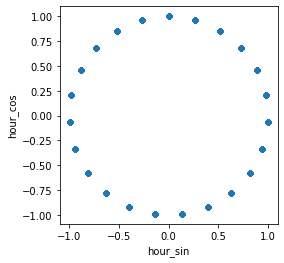

In [36]:
# check with a scatter plot of the two new features if the encoding is correct
df_availability_and_weather.plot.scatter('hour_sin', 'hour_cos').set_aspect('equal')

### Understanding Data

In [37]:
# Look at correlations for all the continuous features.
df_availability_and_weather[['temperature', 'cloudiness', 'windSpeed', 'rain', 'snow', 'hour_sin', 'hour_cos', 'availableBikes']].corr()

,temperature,cloudiness,windSpeed,rain,snow,hour_sin,hour_cos,availableBikes
temperature,1.000000,0.121272,0.288680,-0.015413,NaN,-0.335960,-0.300240,-0.099632
cloudiness,0.121272,1.000000,0.189760,0.081764,NaN,0.056242,-0.037829,-0.002879
windSpeed,0.288680,0.189760,1.000000,0.097880,NaN,-0.144454,-0.105984,-0.085962
rain,-0.015413,0.081764,0.097880,1.000000,NaN,-0.032149,-0.041557,-0.001022
snow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hour_sin,-0.335960,0.056242,-0.144454,-0.032149,NaN,1.000000,-0.004714,0.022930
hour_cos,-0.300240,-0.037829,-0.105984,-0.041557,NaN,-0.004714,1.000000,0.032687
availableBikes,-0.099632,-0.002879,-0.085962,-0.001022,NaN,0.022930,0.032687,1.000000


In [38]:
df_availability_and_weather['snow'].value_counts()

0.0    488289
Name: snow, dtype: int64

NaN values are expected for snow since at the moment the values are all 0s, it doesn't vary
- There isn't a linear relationship between any of the continuous features and the target feature
- However, we are trying to fit a model with many features at once and linear regression may still be a good fit in this higher dimensional space

## Training a model for all stations with continuous and categorical features

### Preparing the features for training

In [39]:
cont_features = ['temperature', 'cloudiness', 'windSpeed', 'rain', 'snow', 'hour_sin', 'hour_cos']

#### Adding categorical features `mainWeather` and `weekday`

*Encoding categorical features with `get_dummies`*

In [40]:
weekday_dummies = pd.get_dummies(df_availability_and_weather['weekday'], prefix='weekday', drop_first=True)
print("Weekday Dummies:", weekday_dummies)

Weekday Dummies:         weekday_Monday  weekday_Saturday  weekday_Sunday  weekday_Thursday  \
0                    0                 1               0                 0   
1                    0                 1               0                 0   
2                    0                 1               0                 0   
3                    0                 1               0                 0   
4                    0                 1               0                 0   
...                ...               ...             ...               ...   
488284               0                 0               0                 1   
488285               0                 0               0                 1   
488286               0                 0               0                 1   
488287               0                 0               0                 1   
488288               0                 0               0                 1   

        weekday_Tuesday  weekday_Wednesday  
0

In [41]:
mainWeather_dummies = pd.get_dummies(df_availability_and_weather['mainWeather'], prefix='mainWeather', drop_first=True)
print("Main Weather Dummies:", mainWeather_dummies)

Main Weather Dummies:         mainWeather_Clouds  mainWeather_Drizzle  mainWeather_Fog  \
0                        1                    0                0   
1                        1                    0                0   
2                        1                    0                0   
3                        1                    0                0   
4                        1                    0                0   
...                    ...                  ...              ...   
488284                   1                    0                0   
488285                   1                    0                0   
488286                   1                    0                0   
488287                   1                    0                0   
488288                   1                    0                0   

        mainWeather_Mist  mainWeather_Rain  
0                      0                 0  
1                      0                 0  
2                      0  

In [42]:
categ_features = weekday_dummies.columns.values.tolist() + mainWeather_dummies.columns.values.tolist()

In [43]:
# check categorical features for training
categ_features

['weekday_Monday',
 'weekday_Saturday',
 'weekday_Sunday',
 'weekday_Thursday',
 'weekday_Tuesday',
 'weekday_Wednesday',
 'mainWeather_Clouds',
 'mainWeather_Drizzle',
 'mainWeather_Fog',
 'mainWeather_Mist',
 'mainWeather_Rain']

In [44]:
# check continuous features for training
cont_features

['temperature',
 'cloudiness',
 'windSpeed',
 'rain',
 'snow',
 'hour_sin',
 'hour_cos']

In [45]:
# add all features together
all_features = cont_features + categ_features
print("\nCont features: ", cont_features)
print("Categ features: ", categ_features)
print("Features: ", all_features)


Cont features:  ['temperature', 'cloudiness', 'windSpeed', 'rain', 'snow', 'hour_sin', 'hour_cos']
Categ features:  ['weekday_Monday', 'weekday_Saturday', 'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday', 'weekday_Wednesday', 'mainWeather_Clouds', 'mainWeather_Drizzle', 'mainWeather_Fog', 'mainWeather_Mist', 'mainWeather_Rain']
Features:  ['temperature', 'cloudiness', 'windSpeed', 'rain', 'snow', 'hour_sin', 'hour_cos', 'weekday_Monday', 'weekday_Saturday', 'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday', 'weekday_Wednesday', 'mainWeather_Clouds', 'mainWeather_Drizzle', 'mainWeather_Fog', 'mainWeather_Mist', 'mainWeather_Rain']


In [46]:
# add encoded features to dataframe
df_availability_and_weather_all_features = pd.get_dummies(df_availability_and_weather, columns=['mainWeather', 'weekday'], drop_first=True)
df_availability_and_weather_all_features

,stationId,totalStands,availableBikes,freeStands,lastUpdate,temperature,cloudiness,windSpeed,rain,snow,...,mainWeather_Drizzle,mainWeather_Fog,mainWeather_Mist,mainWeather_Rain,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
0,2,20,10,10,2021-02-27 17:35:14,9.34,75.0,2.57,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
1,2,20,10,10,2021-02-27 17:45:23,9.20,75.0,1.03,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
2,2,20,10,10,2021-02-27 17:55:32,9.48,75.0,1.03,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
3,2,20,11,9,2021-02-27 18:00:42,9.22,75.0,1.03,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
4,2,20,11,9,2021-02-27 18:10:51,8.85,75.0,0.51,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
488284,117,40,3,37,2021-04-01 13:39:58,8.13,90.0,7.72,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
488285,117,40,4,36,2021-04-01 13:47:32,8.18,90.0,7.20,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
488286,117,40,4,36,2021-04-01 13:57:38,8.18,90.0,7.20,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
488287,117,40,4,36,2021-04-01 14:07:44,8.18,90.0,7.20,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0


In [47]:
# save this dataframe as .csv file
df_availability_and_weather_all_features.to_csv("stations_dataframe_all_features.csv")

### Training a model for each station for each split
*Multiple linear regression*

*We are building a model per station so each station data needs to be filtered from the original CSV which has data on all stations*

In [48]:
# get station rows from original csv
# returns a dataframe with the rows that have the station_id as value in stationId column
def filter_station_data(df, station_id):
    station_df = df.loc[(df['stationId'] == station_id)]
    return station_df

In [49]:
# Our data should already be ordered by default, but just to make sure this function orders everyhting by lastUpdate
def order_df_by_lastUpdate(station_df):
    station_df_time_ordered = station_df.sort_values(['lastUpdate'])
    # need to reset index after sorting
    station_df_time_ordered_reset = station_df_time_ordered.reset_index(drop=True)
    return station_df_time_ordered_reset

In [192]:
# separate descriptive features and target feature
# returns two dataframes 
def get_station_features_and_target(station_dataframe_ordered, features):
    X = station_dataframe_ordered[features]
    y = station_dataframe_ordered.availableBikes
    # print("\nDescriptive features in X:\n", X)
    # print("\nTarget feature in y:\n", y)
    return X, y

In [193]:
# this function fits a linear regression model to the training data
# returns the model learned
def apply_linear_model_to_training_data(X_training_data, y_training_data):
    model = LinearRegression().fit(X_training_data, y_training_data)
    return model

In [200]:
# this function splits the station data into training and test for 'n_splits' times and trains a model for each split
# returns a dictionary with number of the split as key and the training and test data and model learned as values
def split_time_series_data_and_train_model_for_each_split(X, y, number_splits, number_test_size, number_gap):
    splits = {}
    for i in range(0, number_splits):
        splits[f'split_{i+1}'] = {}
    
    # we can set different test sizes and splits to see the difference in the outcome if we want
        # we can also add a gap between train and test data
    # test_size defaults to: n_samples // (n_splits + 1) --> so if we want at least 20% of data for test
        # n_splits should be max 4 and test_size=None
    tscv = TimeSeriesSplit(n_splits=number_splits, test_size=number_test_size, gap=number_gap)
    
    split_index = 1
    
    # split data 'n_splits' times
    for train_index, test_index in tscv.split(X):
        # print("TRAIN:", train_index, "TEST:", test_index)
        
        # separate data in training and test data for both descriptive features and target feature
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # store data of the current split in 'splits' dictionary
        splits[f'split_{split_index}']['X_train'] = X_train
        splits[f'split_{split_index}']['X_test'] = X_test
        splits[f'split_{split_index}']['y_train'] = y_train
        splits[f'split_{split_index}']['y_test'] = y_test
        
        # fit the model for the current split on training data
        model_for_split = apply_linear_model_to_training_data(X_train, y_train)
        
        # store the model learned for the current split data in 'splits' dictionary
        splits[f'split_{split_index}']['Model'] = model_for_split
        split_index += 1
        
    #print('splits:', splits)
    return splits

In [201]:
def train_linear_model_per_station(df, station_id_list, features, number_splits, number_test_size, number_gap):
   
    # initialise a dict that will store the station models for each split for all stations
    stations_splits_and_models = {}
    for station_id in station_id_list:
        # create a key with each station Id and assign another dict as a value that will hold the features, splits, and models learned
        stations_splits_and_models[station_id] = {'Features': features}

        # get rows with stationId == station_id separated by descriptive features and target feature
        df_station_data = filter_station_data(df, station_id)

        # get station data ordered by lastUpdate to make sure data is sequential timewise
        df_station_time_ordered = order_df_by_lastUpdate(df_station_data)

        # separate descriptive features from target feature
        X, y = get_station_features_and_target(df_station_time_ordered, features)

        # split data into test and training data using TimeSeriesSplit and train the model for each split     
        splits = split_time_series_data_and_train_model_for_each_split(X, y, number_splits, number_test_size, number_gap)

        for key in splits.keys():
            stations_splits_and_models[station_id][key] = {}

            split_coeficients = splits[key]['Model'].coef_.tolist()
            split_intercept = splits[key]['Model'].intercept_
            split_model = splits[key]['Model']
            split_X_train = splits[key]['X_train']
            split_X_test = splits[key]['X_test']
            split_y_train = splits[key]['y_train']
            split_y_test = splits[key]['y_test']
            
            # store data in each split
            stations_splits_and_models[station_id][key]['X_train'] = split_X_train
            stations_splits_and_models[station_id][key]['X_test'] = split_X_test
            stations_splits_and_models[station_id][key]['y_train'] = split_y_train
            stations_splits_and_models[station_id][key]['y_test'] = split_y_test
            
            # store model learned for each split for the current station in 'stations_splits_and_models' dict
            stations_splits_and_models[station_id][key]['Coeficients'] = split_coeficients
            stations_splits_and_models[station_id][key]['Intercept'] = split_intercept
            stations_splits_and_models[station_id][key]['Model'] = split_model
                                                         
    # return features, splits data and all models learned for each split for every station in a dict
    return stations_splits_and_models

*Get the trained models for each station*

In [202]:
stations_splits_and_models = train_linear_model_per_station(df_availability_and_weather_all_features, station_id_list, all_features, number_splits=4, number_test_size=None, number_gap=0)

In [203]:
# this dict has the features, splits and models learned for each split for every station
stations_splits_and_models

{2: {'Features': ['temperature',
   'cloudiness',
   'windSpeed',
   'rain',
   'snow',
   'hour_sin',
   'hour_cos',
   'weekday_Monday',
   'weekday_Saturday',
   'weekday_Sunday',
   'weekday_Thursday',
   'weekday_Tuesday',
   'weekday_Wednesday',
   'mainWeather_Clouds',
   'mainWeather_Drizzle',
   'mainWeather_Fog',
   'mainWeather_Mist',
   'mainWeather_Rain'],
  'split_1': {'X_train':      temperature  cloudiness  windSpeed  rain  snow  hour_sin  hour_cos  \
   0           9.34        75.0       2.57  0.00   0.0 -0.997669 -0.068242   
   1           9.20        75.0       1.03  0.00   0.0 -0.997669 -0.068242   
   2           9.48        75.0       1.03  0.00   0.0 -0.997669 -0.068242   
   3           9.22        75.0       1.03  0.00   0.0 -0.979084  0.203456   
   4           8.85        75.0       0.51  0.00   0.0 -0.979084  0.203456   
   ..           ...         ...        ...   ...   ...       ...       ...   
   872         5.75        75.0       3.60  0.00   0.0  0.00

*Get the predictions (for each split) and metrics (for each split and the average over all splits) for every station*

In [92]:
# function to predict target feature on data
def get_predictions(model_for_station, data):
    data_converted_2D_array = data.to_numpy()
    predictions = model_for_station.predict(data_converted_2D_array)
    return predictions

In [206]:
# get predicted availableBikes values for each split for each station
# accepts data as argument --> training data or test data
def get_predictions_and_metrics_for_each_split_all_stations(stations_splits_and_models_dict, X_train_or_test_data, y_train_or_test_data):
    
    if X_train_or_test_data == 'X_train' and y_train_or_test_data == 'y_train':
        X_data = 'X_train'
        y_data = 'y_train'
    elif X_train_or_test_data == 'X_test' and y_train_or_test_data == 'y_test':
        X_data = 'X_test'
        y_data = 'y_test'
        
    station_predictions = {}

    stations_ids = list(stations_splits_and_models_dict.keys())
    for station_id in stations_ids:
        station_predictions[station_id] = {}
        split_keys = list(stations_splits_and_models_dict[station_id].keys())

        # for each station get each split and the model learned for each split and predict on each split
        for i in range(1, len(split_keys)):
            station_predictions[station_id][split_keys[i]] = {}
            
            X_split = stations_splits_and_models_dict[station_id][split_keys[i]][X_data]
            model_for_X_split = stations_splits_and_models_dict[station_id][split_keys[i]]['Model']
            y_split = stations_splits_and_models_dict[station_id][split_keys[i]][y_data]
            predictions_on_X_split = get_predictions(model_for_X_split, X_split)

            # add data and predictions for each split to the dict
            station_predictions[station_id][split_keys[i]][X_data] = X_split
            station_predictions[station_id][split_keys[i]][y_data] = y_split
            station_predictions[station_id][split_keys[i]]['availability_predictions'] = predictions_on_X_split
            
            # get metrics of predictions
            mae, mse, rmse, r2 = calculate_metrics_of_prediction(y_split, predictions_on_X_split)
            station_predictions[station_id][split_keys[i]]['Metrics'] = {}
            station_predictions[station_id][split_keys[i]]['Metrics']['MAE'] = mae
            station_predictions[station_id][split_keys[i]]['Metrics']['MSE'] = mse
            station_predictions[station_id][split_keys[i]]['Metrics']['RMSE'] = rmse
            station_predictions[station_id][split_keys[i]]['Metrics']['R2'] = r2
    
    stations_predictions_with_avg_metrics = add_avg_metrics_over_splits_to_station_dict(station_predictions)
            
    return stations_predictions_with_avg_metrics

In [142]:
def calculate_metrics_of_prediction(y_data_actual_values, availability_predictions):
    mae = metrics.mean_absolute_error(y_data_actual_values, availability_predictions)
    mse = metrics.mean_squared_error(y_data_actual_values, availability_predictions)
    rmse = metrics.mean_squared_error(y_data_actual_values, availability_predictions)**0.5
    r2 = metrics.r2_score(y_data_actual_values, availability_predictions)
    return mae, mse, rmse, r2

In [174]:
def get_average_metric_value_over_splits(values_list):
    sum_values = 0
    for value in values_list:
            sum_values += value
    avg_value = sum_values/len(values_list)
    return avg_value

In [207]:
def add_avg_metrics_over_splits_to_station_dict(predictions_dict):
    
    for station_key in predictions_dict.keys():
        mae_values = []
        mse_values = []
        rmse_values = []
        r2_values = []
            
        for split_key in predictions_dict[station_key].keys():
            split_metrics_dict = predictions_dict[station_key][split_key]['Metrics']
             
            for metric_key in split_metrics_dict.keys():
                if metric_key == 'MAE':
                    mae_values.append(split_metrics_dict[metric_key])
                if metric_key == 'MSE':
                    mse_values.append(split_metrics_dict[metric_key])
                if metric_key == 'RMSE':
                    rmse_values.append(split_metrics_dict[metric_key])
                elif metric_key == 'R2':
                    r2_values.append(split_metrics_dict[metric_key])
        
        
        avg_mae = get_average_metric_value_over_splits(mae_values)
        avg_mse = get_average_metric_value_over_splits(mse_values)
        avg_rmse = get_average_metric_value_over_splits(rmse_values)
        avg_r2 = get_average_metric_value_over_splits(r2_values)
        
        predictions_dict[station_key]['AVG Metrics'] = {'AVG MAE': avg_mae, 'AVG MSE': avg_mse,
                                                        'AVG RMSE': avg_rmse, 'AVG R2': avg_r2}
    return predictions_dict

In [189]:
# get predicted availability values and metrics on training data for all stations for each data split
predictions_training_data = get_predictions_and_metrics_for_each_split_all_stations(stations_splits_and_models, 'X_train', 'y_train')
# this dict has the predictions for each station for each train data split, the metrics per split
    # and the avg across all splits
predictions_training_data

{2: {'split_1': {'X_train':      temperature  cloudiness  windSpeed  rain  snow  hour_sin  hour_cos  \
   0           9.34        75.0       2.57  0.00   0.0 -0.997669 -0.068242   
   1           9.20        75.0       1.03  0.00   0.0 -0.997669 -0.068242   
   2           9.48        75.0       1.03  0.00   0.0 -0.997669 -0.068242   
   3           9.22        75.0       1.03  0.00   0.0 -0.979084  0.203456   
   4           8.85        75.0       0.51  0.00   0.0 -0.979084  0.203456   
   ..           ...         ...        ...   ...   ...       ...       ...   
   872         5.75        75.0       3.60  0.00   0.0  0.000000  1.000000   
   873         5.74        75.0       3.60  0.26   0.0  0.269797  0.962917   
   874         5.72        75.0       3.60  0.11   0.0  0.269797  0.962917   
   875         5.82        75.0       3.09  1.33   0.0  0.269797  0.962917   
   876         5.68        75.0       3.09  1.13   0.0  0.269797  0.962917   
   
        weekday_Monday  weekday_Sat

In [205]:
# get predicted availability values and metrics on test data for all stations for each data split
predictions_test_data = get_predictions_and_metrics_for_each_split_all_stations(stations_splits_and_models, 'X_test', 'y_test')
# this dict has the predictions for each station for each test data split, the metrics per split
    # and the avg across all splits
predictions_test_data

{2: {'split_1': {'X_test':       temperature  cloudiness  windSpeed  rain  snow  hour_sin  hour_cos  \
   877          5.68        75.0       3.09  0.65   0.0  0.269797  0.962917   
   878          5.68        75.0       2.57  0.24   0.0  0.269797  0.962917   
   879          5.68        75.0       2.57  0.00   0.0  0.519584  0.854419   
   880          5.68        75.0       2.57  0.00   0.0  0.519584  0.854419   
   881          5.77        75.0       3.09  0.00   0.0  0.519584  0.854419   
   ...           ...         ...        ...   ...   ...       ...       ...   
   1747         5.05        75.0      10.29  0.42   0.0 -0.519584  0.854419   
   1748         5.05        75.0      10.29  0.49   0.0 -0.519584  0.854419   
   1749         4.98        75.0       7.72  1.00   0.0 -0.519584  0.854419   
   1750         4.98        75.0       7.72  2.00   0.0 -0.519584  0.854419   
   1751         5.27        75.0      10.29  0.20   0.0 -0.519584  0.854419   
   
         weekday_Monday 